# CITE-seq analysis with totalVI

With totalVI, we can produce a joint latent representation of cells, denoised data for both protein and RNA, integrate datasets, and compute differential expression of RNA and protein. Here we demonstrate this functionality with an integrated analysis of PBMC10k and PBMC5k, datasets of peripheral blood mononuclear cells publicly available from 10X Genomics subset to the 14 shared proteins between them. The same pipeline would generally be used to analyze a single CITE-seq dataset.

If you use totalVI, please consider citing:

- Gayoso, A., Steier, Z., Lopez, R., Regier, J., Nazor, K. L., Streets, A., & Yosef, N. (2021). Joint probabilistic modeling of single-cell multi-omic data with totalVI. Nature Methods, 18(3), 272-282.

```{note}
Running the following cell will install tutorial dependencies on Google Colab only. It will have no effect on environments other than Google Colab.
```

In [1]:
!pip install --quiet scvi-colab
from scvi_colab import install

install()


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


/usr/local/lib/python3.12/site-packages/scvi_colab/_core.py:42: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import ContextualVersionConflict
/usr/local/lib/python3.12/site-packages/scvi_colab/_core.py:47: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


## Imports and data loading

In [2]:
import os
import tempfile

import matplotlib.pyplot as plt
import muon
import numpy as np
import requests
import scanpy as sc
import scvi
import seaborn as sns
import torch

/usr/local/lib/python3.12/site-packages/leidenalg/VertexPartition.py:413: SyntaxWarning: invalid escape sequence '\m'
  .. math:: Q = \\frac{1}{m} \\sum_{ij} \\left(A_{ij} - \\frac{k_i^\mathrm{out} k_j^\mathrm{in}}{m} \\right)\\delta(\\sigma_i, \\sigma_j),
/usr/local/lib/python3.12/site-packages/leidenalg/VertexPartition.py:788: SyntaxWarning: invalid escape sequence '\m'
  .. math:: Q = \\sum_{ij} \\left(A_{ij} - \\gamma \\frac{k_i^\mathrm{out} k_j^\mathrm{in}}{m} \\right)\\delta(\\sigma_i, \\sigma_j),
/usr/local/lib/python3.12/site-packages/leidenalg/Optimiser.py:27: SyntaxWarning: invalid escape sequence '\g'
  implementation therefore does not guarantee subpartition :math:`\gamma`-density.
/usr/local/lib/python3.12/site-packages/leidenalg/Optimiser.py:346: SyntaxWarning: invalid escape sequence '\s'
  .. math:: Q = \sum_k \\lambda_k Q_k.


/usr/local/lib/python3.12/site-packages/pyro/ops/stats.py:527: SyntaxWarning: invalid escape sequence '\g'
  we have :math:`ES^{*}(P,Q) \ge ES^{*}(Q,Q)` with equality holding if and only if :math:`P=Q`, i.e.


In [3]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.3.2


```{note}
You can modify `save_dir` below to change where the data files for this tutorial are saved.
```

In [4]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

### Load mudata
For this tutorial we use an integrated PBMC10k and PBMC5k dataset available from 10X Genomics. To see the exact preprocessing that was done, or to preprocess your own CITE-seq dataset for use with scvi-tools models, see our [preprocessing tutorial](../notebooks/processing/preprocessing).

In [5]:
mdata_path = os.path.join(save_dir.name, "CITE-seq_pbmc_combined_preprocessed.h5mu")

# Figshare direct download URL
url = "https://figshare.com/ndownloader/files/52859294"

# Download only if file doesn't already exist
if not os.path.exists(mdata_path):
    print(f"Downloading MuData file to {mdata_path}...")
    r = requests.get(url)
    with open(mdata_path, "wb") as f:
        f.write(r.content)

# Load the MuData object
mdata = muon.read_h5mu(mdata_path)

/usr/local/lib/python3.12/site-packages/mudata/_core/mudata.py:1598: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
  self._update_attr("var", axis=0, join_common=join_common)
/usr/local/lib/python3.12/site-packages/mudata/_core/mudata.py:1461: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
  self._update_attr("obs", axis=1, join_common=join_common)


### Setup mudata

Now we run `setup_mudata`, which is the MuData analog to `setup_anndata`. The caveat of this workflow is that we need to provide this function which modality of the `mdata` object contains each piece of data. So for example, the batch information is in `mdata.mod["rna"].obs["batch"]`. Therefore, in the `modalities` argument below we specify that the `batch_key` can be found in the `"rna_subset"` modality of the MuData object.

Notably, we provide `protein_layer=None`. This means scvi-tools will pull information from `.X` from the modality specified in `modalities` (`"protein"` in this case). In the case of RNA, we want to use the counts, which we stored in `mdata.mod["rna"].layers["counts"]`.

In [6]:
mdata

MuData object with n_obs × n_vars = 13112 × 2193
  2 modalities
    rna_subset:	13112 x 2176
      layers:	'counts'
    prot:	13112 x 17

In [7]:
# we need to work with dense, not sparse matricies
mdata["prot"].X = mdata["prot"].X.toarray()
mdata["rna_subset"].X = mdata["rna_subset"].X.toarray()
mdata.mod["rna_subset"].layers["counts"] = mdata.mod["rna_subset"].layers["counts"].toarray()

Note: wasn't sure if I should combine two datasets similar to the current tutorial. Otherwise I assume I don't specify a batch key if there's just one dataset?

In [8]:
scvi.model.TOTALVI.setup_mudata(
    mdata,
    rna_layer="counts",
    protein_layer=None,
    modalities={
        "rna_layer": "rna_subset",
        "protein_layer": "prot",
    },
)

```{note}
Specify the modality of each argument via the `modalities` dictionary, which maps layer/key arguments to MuData modalities.
```

## Prepare and run model

For the rest of this tutorial we will use the model with the external data we loaded.

In [9]:
model = scvi.model.TOTALVI(mdata)

INFO     Computing empirical prior initialization for protein background.                                          


In [10]:
model.train(early_stopping=True)

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/usr/local/lib/python3.12/site-packages/lightning/pytorch/core/optimizer.py:317: The lr scheduler dict contains the key(s) ['monitor'], but the keys will be ignored. You need to call `lr_scheduler.step()` manually in manual optimization.
/usr/local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.
/usr/local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=400` reached.


We will plot the loss curves for training and validation using auto alignment for the yaxis

In [11]:
last_val_valid = np.array(model.history["elbo_validation"])[-1]
last_val_train = np.array(model.history["elbo_train"])[-1]
global_min_loss = min(
    np.min(model.history["elbo_train"]), np.min(model.history["elbo_validation"])
)
last_max_loss = max(last_val_train, last_val_valid)[0]
global_max_loss = max(
    np.max(model.history["elbo_train"]), np.max(model.history["elbo_validation"])
)

In [12]:
# Compute the min and max of both train and validation losses
min_loss = min(min(last_val_train, last_val_valid), global_min_loss)
max_loss = max(max(last_val_train, last_val_valid), global_max_loss)
ylim_min = 0.995 * min_loss  # 0.5% below the minimum
ylim_max = min(
    global_max_loss, ylim_min + (last_max_loss - ylim_min) * 4
)  # keep it under the 25% part of figure

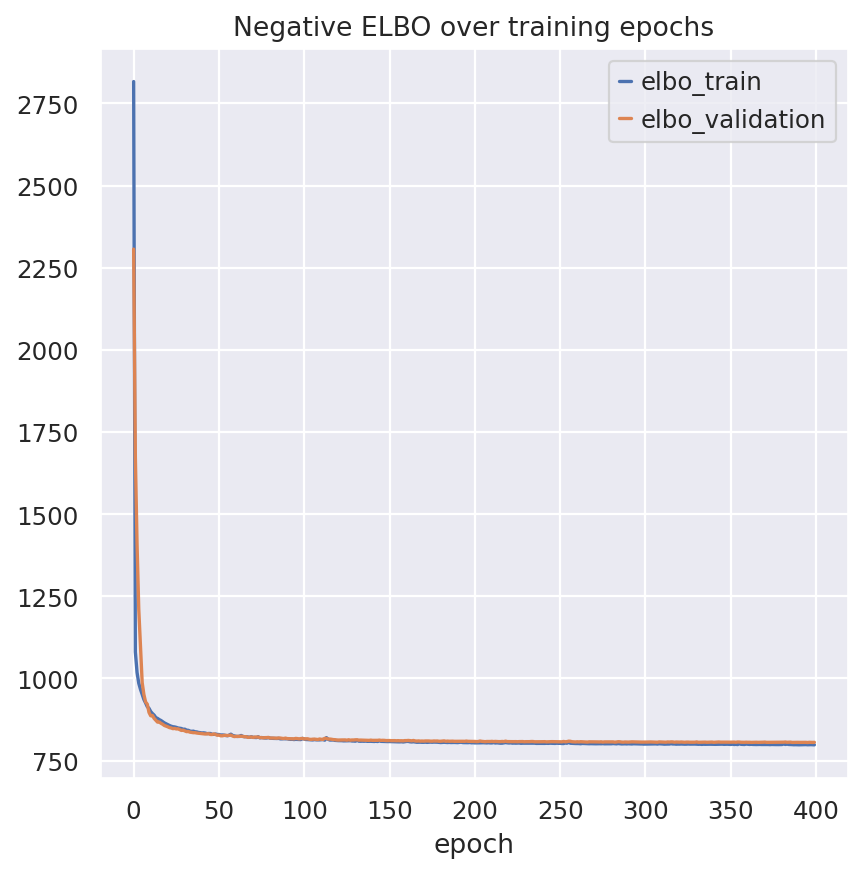

In [13]:
fig, ax = plt.subplots(1, 1)
model.history["elbo_train"].plot(ax=ax, label="train")
model.history["elbo_validation"].plot(ax=ax, label="validation")
if isinstance(ylim_min, (int, float)) and isinstance(ylim_max, (int, float)):
    ax.set(title="Negative ELBO over training epochs", ylim=(ylim_min, ylim_max))
else:
    ax.set(title="Negative ELBO over training epochs")
ax.legend()

## Analyze outputs

We use Scanpy and muon for clustering and visualization after running totalVI. It's also possible to save totalVI outputs for an R-based workflow.

In [14]:
rna = mdata.mod["rna_subset"]
protein = mdata.mod["prot"]

In [15]:
# arbitrarily store latent in rna modality
TOTALVI_LATENT_KEY = "X_totalVI"
rna.obsm[TOTALVI_LATENT_KEY] = model.get_latent_representation()

In [16]:
rna_denoised, protein_denoised = model.get_normalized_expression(n_samples=25, return_mean=True)
rna.layers["denoised_rna"] = rna_denoised
protein.layers["denoised_protein"] = protein_denoised

protein.layers["protein_foreground_prob"] = 100 * model.get_protein_foreground_probability(
    n_samples=25, return_mean=True
)
parsed_protein_names = [p.split("_")[0] for p in protein.var_names]
protein.var["clean_names"] = parsed_protein_names
mdata.update()

/usr/local/lib/python3.12/site-packages/mudata/_core/mudata.py:1598: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
  self._update_attr("var", axis=0, join_common=join_common)
/usr/local/lib/python3.12/site-packages/mudata/_core/mudata.py:1461: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
  self._update_attr("obs", axis=1, join_common=join_common)


Now we can compute clusters and visualize the latent space.

In [17]:
TOTALVI_CLUSTERS_KEY = "leiden_totalVI"

sc.pp.neighbors(rna, use_rep=TOTALVI_LATENT_KEY)
sc.tl.umap(rna)
sc.tl.leiden(rna, key_added=TOTALVI_CLUSTERS_KEY)

/tmp/ipykernel_162/3902110435.py:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(rna, key_added=TOTALVI_CLUSTERS_KEY)


In [18]:
mdata.update()

/usr/local/lib/python3.12/site-packages/mudata/_core/mudata.py:1598: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
  self._update_attr("var", axis=0, join_common=join_common)
/usr/local/lib/python3.12/site-packages/mudata/_core/mudata.py:1461: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
  self._update_attr("obs", axis=1, join_common=join_common)


We can now use muon plotting functions which can pull data from either modality of the MuData object. We will show the umap of the model embeddings with leiden clusters (and batch inegration of the datasets if exists). Following that we will show the denoised protein values and the foreground probability of the 14 protein listed.

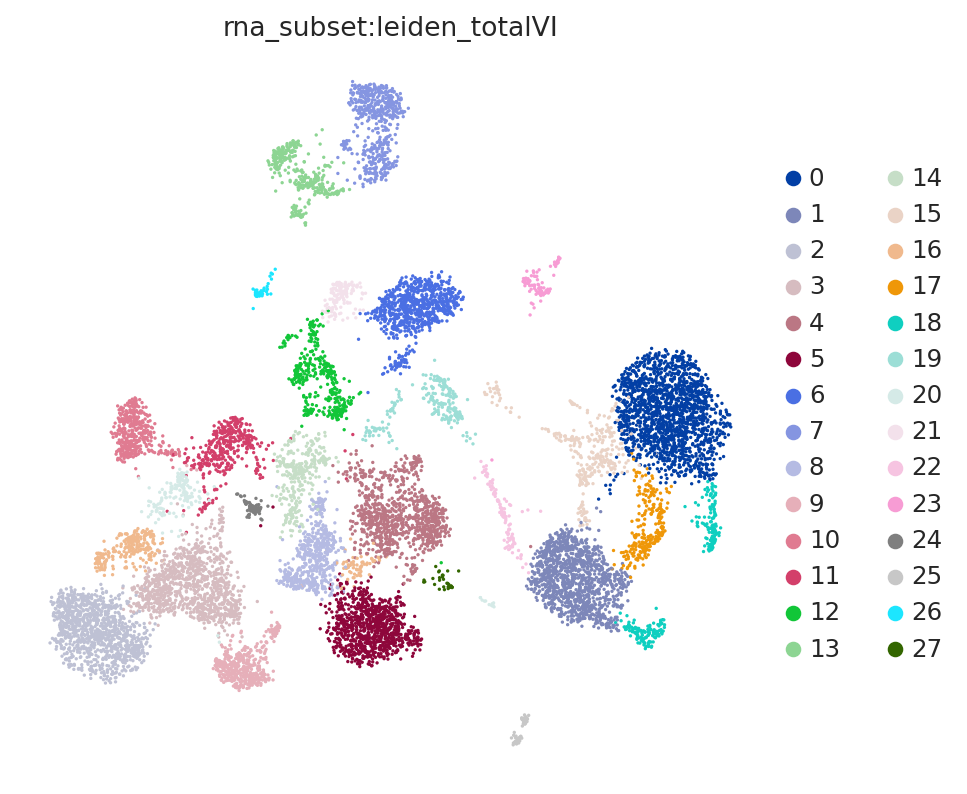

In [19]:
muon.pl.embedding(
    mdata,
    basis="rna_subset:X_umap",
    color=[f"rna_subset:{TOTALVI_CLUSTERS_KEY}"],
    frameon=False,
    ncols=1,
)

### Visualize denoised protein values

In [20]:
max_prot_to_plot = 14
protein.var_names[:max_prot_to_plot]

Index(['CD3_TotalSeqB', 'CD4_TotalSeqB', 'CD8a_TotalSeqB', 'CD14_TotalSeqB',
       'CD15_TotalSeqB', 'CD16_TotalSeqB', 'CD56_TotalSeqB', 'CD19_TotalSeqB',
       'CD25_TotalSeqB', 'CD45RA_TotalSeqB', 'CD45RO_TotalSeqB',
       'PD-1_TotalSeqB', 'TIGIT_TotalSeqB', 'CD127_TotalSeqB'],
      dtype='object')

/usr/local/lib/python3.12/site-packages/muon/_core/plot.py:244: ImplicitModificationWarning: Modifying `X` on a view results in data being overridden
  fmod_adata.X = x.todense() if issparse(x) else x


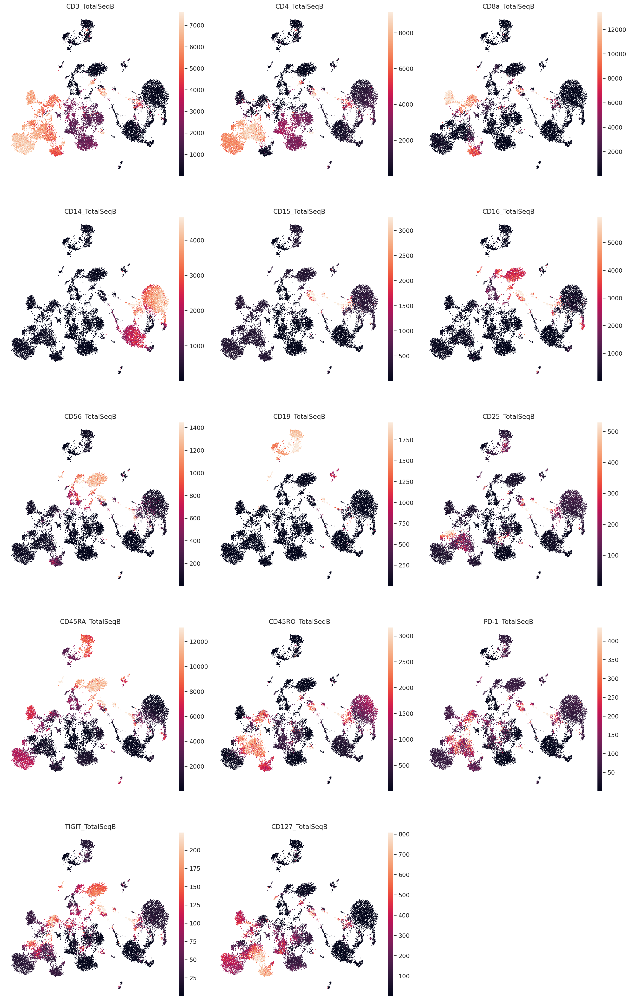

In [21]:
muon.pl.embedding(
    mdata,
    basis="rna_subset:X_umap",
    color=protein.var_names[:max_prot_to_plot],
    frameon=False,
    ncols=3,
    vmax="p99",
    wspace=0.1,
    layer="denoised_protein",
)

### Visualize probability of foreground

Here we visualize the probability of foreground for the first 14 proteins in the list and cell (projected on UMAP).
Some proteins are easier to disentangle than others. Some proteins end up being "all background".
For example, CD15 does not appear to be captured well, when looking at the denoised values above we see little localization in the monocytes.

```{note}
While the foreground probability could theoretically be used to identify cell populations, we recommend using the denoised protein expression, which accounts for the foreground/background probability, but preserves the dynamic range of the protein measurements. Consequently, the denoised values are on the same scale as the raw data and it may be desirable to take a transformation like log or square root.
```

By viewing the foreground probability, we can get a feel for the types of cells in our dataset. For example, it's very easy to see a population of monocytes based on the CD14 foregroud probability.

/usr/local/lib/python3.12/site-packages/muon/_core/plot.py:244: ImplicitModificationWarning: Modifying `X` on a view results in data being overridden
  fmod_adata.X = x.todense() if issparse(x) else x


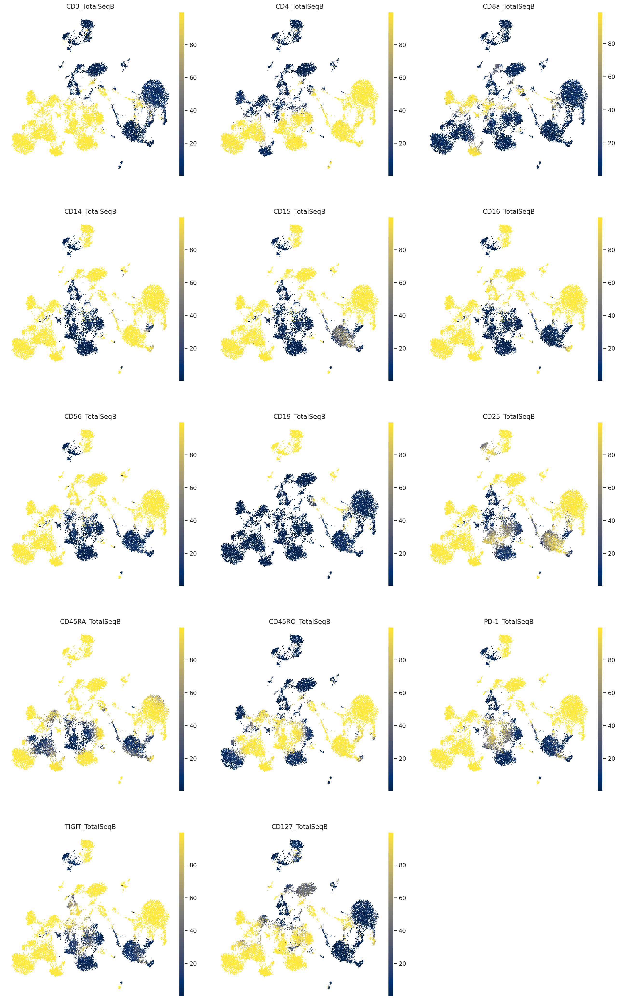

In [22]:
muon.pl.embedding(
    mdata,
    basis="rna_subset:X_umap",
    layer="protein_foreground_prob",
    color=protein.var_names[:max_prot_to_plot],
    frameon=False,
    ncols=3,
    vmax="p99",
    wspace=0.1,
    color_map="cividis",
)

## Differential expression

Here we do a one-vs-all DE test, where each cluster is tested against all cells not in that cluster. The results for each of the one-vs-all tests is concatenated into one DataFrame object. Inividual tests can be sliced using the "comparison" column. Genes and proteins are included in the same DataFrame.

```{important}
We do not recommend using totalVI denoised values in other differential expression tools, as denoised values are a summary of a random quantity. The totalVI DE test takes into account the full uncertainty of the denoised quantities.
```

In [23]:
de_df = model.differential_expression(
    groupby="rna_subset:leiden_totalVI", delta=0.5, batch_correction=True
)
de_df.head(5)

/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:825: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


DE...:   0%|          | 0/28 [00:00<?, ?it/s]

/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


/usr/local/lib/python3.12/site-packages/scvi/model/_totalvi.py:474: UserWarning: Make sure the registered protein expression in anndata contains unnormalized count data.
  adata = self._validate_anndata(adata)


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
G0S2,0.9842,0.0158,4.131819,0.001411,0.000047,0.00001,0.5,6.524432,6.536014,2.507093,...,1.688761,0.064692,0.423631,0.019513,9.929103,0.305032,True,0 vs Rest,0,Rest
HBEGF,0.9832,0.0168,4.069433,0.000506,0.000036,0.00001,0.5,4.926741,4.959311,1.894561,...,0.829971,0.054584,0.458213,0.035598,4.531052,0.319434,True,0 vs Rest,0,Rest
AC020656.1,0.9824,0.0176,4.022099,0.001480,0.000097,0.00001,0.5,5.084967,5.288685,1.756289,...,2.514697,0.155138,0.806916,0.082535,13.967714,0.832240,True,0 vs Rest,0,Rest
ANPEP,0.9770,0.0230,3.748992,0.000857,0.000060,0.00001,0.5,6.501331,6.992975,2.782112,...,1.213256,0.106794,0.655908,0.069702,7.202952,0.481174,True,0 vs Rest,0,Rest
TMEM170B,0.9756,0.0244,3.688469,0.000548,0.000052,0.00001,0.5,4.866441,5.057579,2.205030,...,0.718732,0.083326,0.471470,0.064956,4.026006,0.407844,True,0 vs Rest,0,Rest


In [24]:
filtered_pro = {}
filtered_rna = {}
cats = rna.obs[TOTALVI_CLUSTERS_KEY].cat.categories
for c in cats:
    cid = f"{c} vs Rest"
    cell_type_df = de_df.loc[de_df.comparison == cid]
    cell_type_df = cell_type_df.sort_values("lfc_median", ascending=False)

    cell_type_df = cell_type_df[cell_type_df.lfc_median > 0]

    pro_rows = cell_type_df.index.str.contains("TotalSeqB")
    data_pro = cell_type_df.iloc[pro_rows]
    data_pro = data_pro[data_pro["bayes_factor"] > 0.7]

    data_rna = cell_type_df.iloc[~pro_rows]
    data_rna = data_rna[data_rna["bayes_factor"] > 3]
    data_rna = data_rna[data_rna["non_zeros_proportion1"] > 0.1]

    filtered_pro[c] = data_pro.index.tolist()[:3]
    filtered_rna[c] = data_rna.index.tolist()[:2]

We can also use general scanpy visualization functions

In [25]:
sc.tl.dendrogram(rna, groupby=TOTALVI_CLUSTERS_KEY, use_rep=TOTALVI_LATENT_KEY)
# This is a bit of a hack to be able to use scanpy dendrogram with the protein data
protein.obs[TOTALVI_CLUSTERS_KEY] = rna.obs[TOTALVI_CLUSTERS_KEY]
protein.obsm[TOTALVI_LATENT_KEY] = rna.obsm[TOTALVI_LATENT_KEY]
sc.tl.dendrogram(protein, groupby=TOTALVI_CLUSTERS_KEY, use_rep=TOTALVI_LATENT_KEY)

Matrix plot displays totalVI denoised protein expression per leiden cluster.

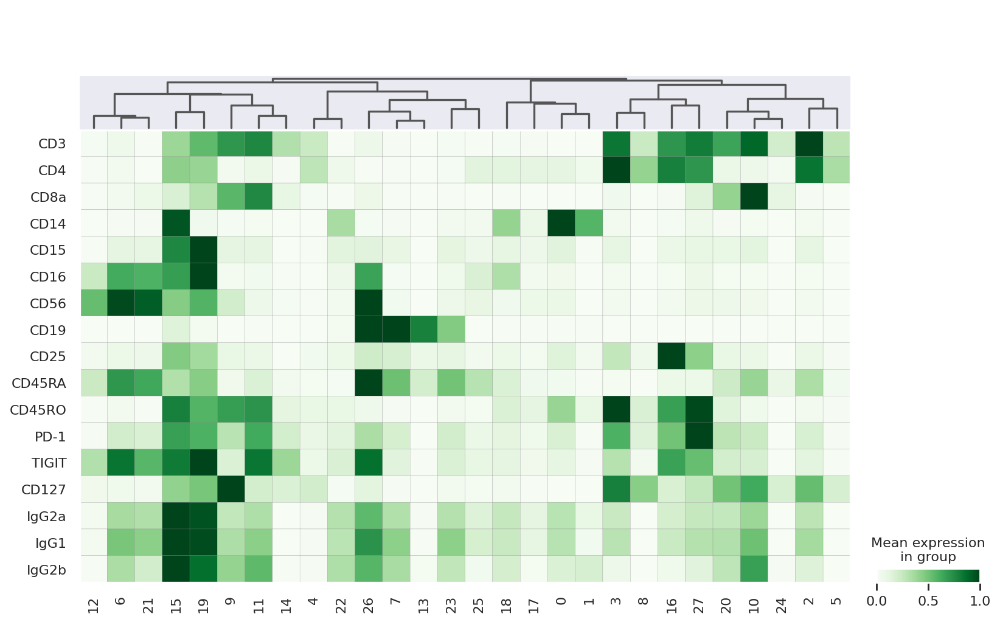

In [26]:
sc.pl.matrixplot(
    protein,
    protein.var["clean_names"],
    groupby=TOTALVI_CLUSTERS_KEY,
    gene_symbols="clean_names",
    dendrogram=True,
    swap_axes=True,
    layer="denoised_protein",
    cmap="Greens",
    standard_scale="var",
)

This is a selection of some of the markers that turned up in the RNA DE test.

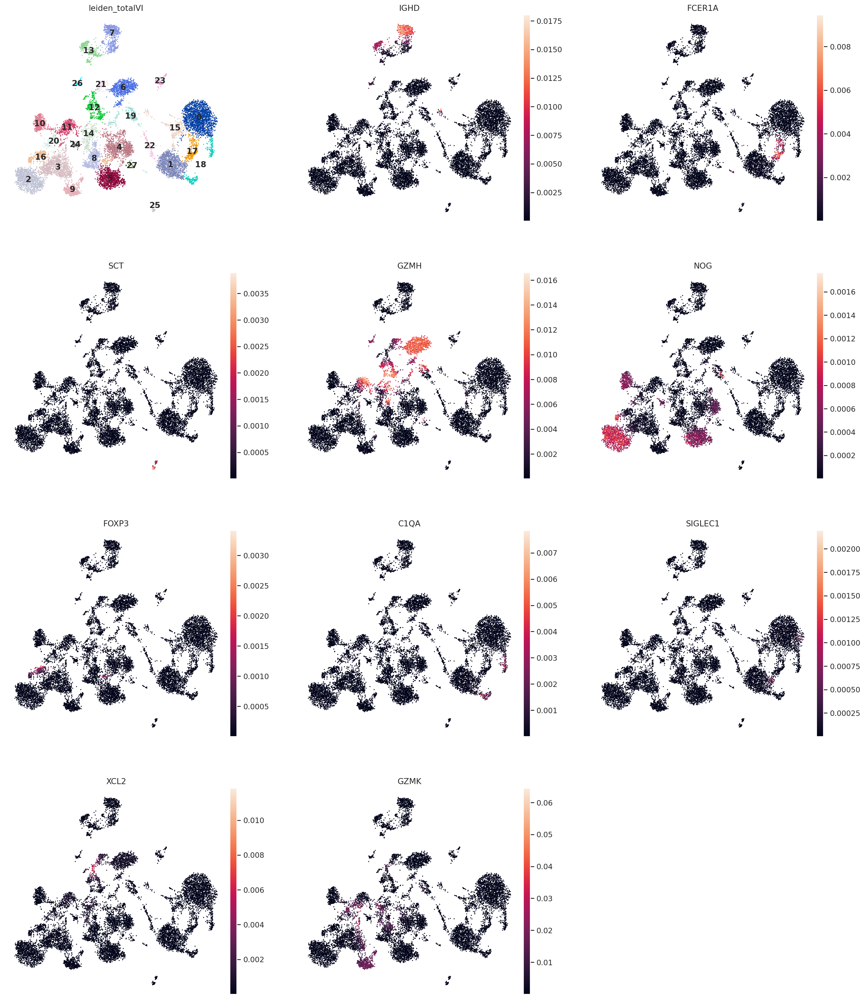

In [27]:
sc.pl.umap(
    rna,
    color=[
        TOTALVI_CLUSTERS_KEY,
        "IGHD",
        "FCER1A",
        "SCT",
        "GZMH",
        "NOG",
        "FOXP3",
        "C1QA",
        "SIGLEC1",
        "XCL2",
        "GZMK",
    ],
    legend_loc="on data",
    frameon=False,
    ncols=3,
    layer="denoised_rna",
    wspace=0.2,
)